<a href="https://colab.research.google.com/github/MominAhmedShaikh/CNN-BinaryClassClassification-Cat-v-Dog/blob/main/CNN_cat_vs_dog_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pre-Requisites (installations and imports)

In [ ]:
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,BatchNormalization,Dropout
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from tensorflow import keras
from keras import Sequential
from keras import layers
import plotly.express as px
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import cv2


### Downloading File from Kaggle

In [ ]:
!pip install -U kaggle -q
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
! chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d tongpython/cat-and-dog

 90% 197M/218M [00:01<00:00, 152MB/s]
100% 218M/218M [00:01<00:00, 166MB/s]


# Function Definitions

In [ ]:
def create_testing_data():
  '''
  Description :
  This Function will create training dataset with train images and its corresponding labels.

  '''

  for category in class_labels :
      path = os.path.join(DATADIR, category)
      class_num = class_labels.index(category)
      for img in os.listdir(path):
          try :
              img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_UNCHANGED)
              new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
              testing_data.append([new_array, class_num])
          except Exception as e:
              pass

In [ ]:
def create_training_data():

  '''
  Description :
  This Function will create testing dataset with test images and its corresponding labels.

  '''

  for category in class_labels :
      path = os.path.join(DATADIR, category)
      class_num = class_labels.index(category)
      for img in os.listdir(path):
          try :
              img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_UNCHANGED)
              new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
              training_data.append([new_array, class_num])
          except Exception as e:
              pass

In [ ]:
def predict_cat(model):
  '''
    Parameters:

    model = Takes input of layered model

    Output:
    
    Predicts cats from 0-25 in test_images, will return predicted and actual label.
    actual label is in ()
    eg . predicted ----> Dog (Dog) <--- actual
    
    '''
  pred = model.predict(test_images)
  y_pred = []
  for i in pred:
    if i > 0.5:
      y_pred.append(1)
    else:
      y_pred.append(0)

  plt.figure(figsize=(15,15))
  for i in range(25):
      plt.subplot(5,5,i+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(train_images[i], cmap=plt.cm.binary)
      if y_pred[i] == test_labels[i]:
        color = 'blue'
        plt.xlabel("{}  ({})".format(class_names[y_pred[i]],
                                  
                                    class_names[test_labels[i]]),
                                    color=color)


      else:
          color = 'red'
          plt.xlabel("{}  ({})".format(class_names[y_pred[i]],
                                    
                                      class_names[test_labels[i]]),
                                      color=color)
  return plt.show()

In [ ]:
def predict_dog(model, range1 = 1748, range2 = 1773):
  '''
    Parameters:

    model = Takes input of layered model

    Output:
    
    Default range is given because the range should be 25 from any point of testing/validation data.
    Last part of the testing data contains images of dog hence more range is taken.
    
    Predicts cats from 25 images in test_images, will return predicted and actual label.
    actual label is in ()
    eg . predicted ----> Dog (Dog) <--- actual
    
    '''
  pred = model.predict(test_images)
  y_pred = []
  for i in pred:
    if i > 0.5:
      y_pred.append(1)
    else:
      y_pred.append(0)
      


  plt.figure(figsize=(15,15))
  counter = [i for i in range(range1,range2)]
  for i in range(25):
      plt.subplot(5,5,i+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(test_images[counter[i]], cmap=plt.cm.binary)
      if y_pred[counter[i]] == test_labels[counter[i]]:
        color = 'blue'
        plt.xlabel("{}  ({})".format(class_names[y_pred[counter[i]]],
                                  
                                    class_names[test_labels[counter[i]]]),
                                    color=color)


      else:
          color = 'red'
          plt.xlabel("{}  ({})".format(class_names[y_pred[counter[i]]],
                                  
                                    class_names[test_labels[counter[i]]]),
                                    color=color)
  return plt.show()

In [ ]:
def plot(model,model_history,title):
    '''
    Plot loss and accuracy of given model

    Parameters:

    model = After Adding layers inside model, pass that model here!
    model_history = Add model history object
    title = title you want to set
    metric = Look for metric (eg . val_loss,val_accuracy,etc)

    '''
    df = pd.DataFrame(model_history.history)
    plt.figure(figsize=(20, 5))
    plt.suptitle(title,fontsize = 20)
    plt.subplot(1, 2, 1)
    
    plt.plot(df['accuracy'],color = 'blue')
    plt.plot(df['val_accuracy'],color = 'red')
    plt.xlabel('# of epochs')
    plt.ylabel('acc metrics')
    plt.legend(['train_accuracy','test_accuracy'])
    
    plt.subplot(1, 2, 2)
    
    plt.plot(df['loss'],color = 'blue')
    plt.plot(df['val_loss'],color = 'red')
    plt.xlabel('# of epochs')
    plt.ylabel('loss metrics')
    plt.legend(['train_loss','test_loss'])
    plt.show()

    
    results = model.evaluate(test_images, test_labels)
    return results


In [ ]:
def model_training_CNN(model,epochs = 20,batch_size = 10):

  '''
    Parameters:

    model = Takes input of layered model
    epochs = default 20 (As early stopping is used)

    Output:
    returns history object later can be fetch for losses and accuracies.

    '''

  model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='binary_crossentropy',
    metrics=['accuracy'])
  
  history = model.fit(train_images
                       , train_labels
                       , epochs=epochs
                       , batch_size = batch_size
                       , validation_data=(test_images, test_labels)
                       , verbose=1
                       , callbacks = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)
        )
  print(model.evaluate(test_images,test_labels))

  return history

In [ ]:
def report(model):

  '''
  Parameters:

    model = Takes input of layered model

    Output:
    returns classification report and displays confusion matrix


  '''

  pred=model.predict(test_images)

  y_pred = []
  for i in pred:
    if i > 0.5:
      y_pred.append(1)
    else:
      y_pred.append(0)

  print(classification_report(y_pred,test_labels,zero_division=0))
  ConfusionMatrixDisplay(confusion_matrix(test_labels,y_pred)).plot()
  
  return plt.show()

# Image Dataset Pre-Processing

### Extracting the Zip file

In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/cat-and-dog.zip', 'r')
zip_ref.extractall()
zip_ref.close()

### Splitting Dataset into train and test images

In [ ]:
IMG_SIZE = 175
DATADIR = '/content/training_set/training_set'
class_labels = ['cats', 'dogs']
training_data = []

create_training_data()


train_images = [] #features
train_labels = [] #labels

for features, label in training_data:
    train_images.append(features)
    train_labels.append(label)

train_images = np.array(train_images).reshape(-1, IMG_SIZE, IMG_SIZE, 3)
train_labels = np.asarray(train_labels)

In [ ]:
IMG_SIZE = 175
DATADIR = '/content/test_set/test_set'
class_labels = ['cats', 'dogs']
testing_data = []


create_testing_data()


test_images = [] #features
test_labels = [] #labels

for features, label in testing_data:
    test_images.append(features)
    test_labels.append(label)

test_images = np.array(test_images).reshape(-1, IMG_SIZE, IMG_SIZE, 3)
test_labels = np.asarray(test_labels)

### Normalization
- Normalizing tensors between 0 and 255
- Normalizing will make sure that pixels are distributed evenly.
- Other methods includes dividing directly by 255, but it consumes all memory and forces system to crash.


In [ ]:
train_images = tf.cast(train_images/255. ,tf.float32)
test_images = tf.cast(test_images/255. ,tf.float32)

In [ ]:
# Assigning classnames for plotting purposes
class_names = ['cat', 'dog']

In [ ]:
len(training_data),len(testing_data)

(8005, 2023)

###  Visualizing train and test images
- One image from training data and one image for testing data to make sure everything is working fine.

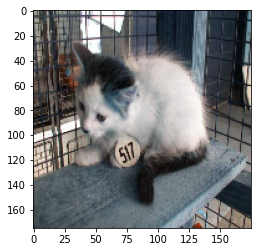

In [ ]:
plt.figure()
plt.imshow(training_data[0][0])
plt.grid(False)
plt.show()

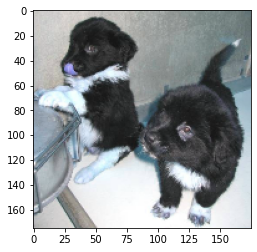

In [ ]:
plt.figure()
plt.imshow(testing_data[2000][0])
plt.grid(False)
plt.show()

#### Visualizing 25 images of cat from train_images
- Displaying first 25 images of training dataset which contains images of Cat (As we have not shuffled the data)


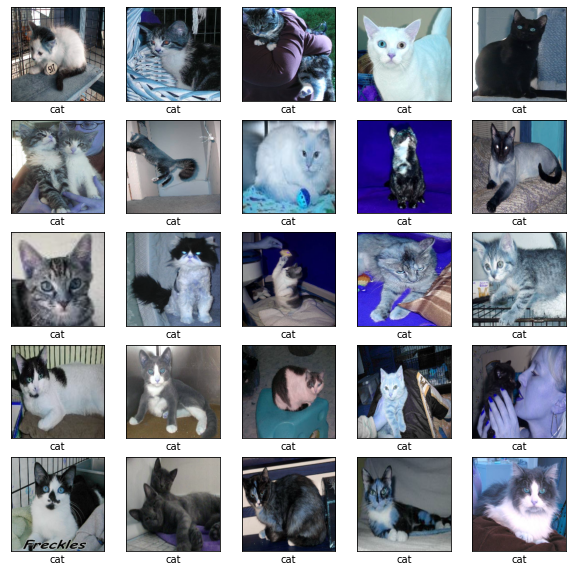

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[training_data[i][1]])
plt.show()

#### Visualizing 25 images of dog from train_images

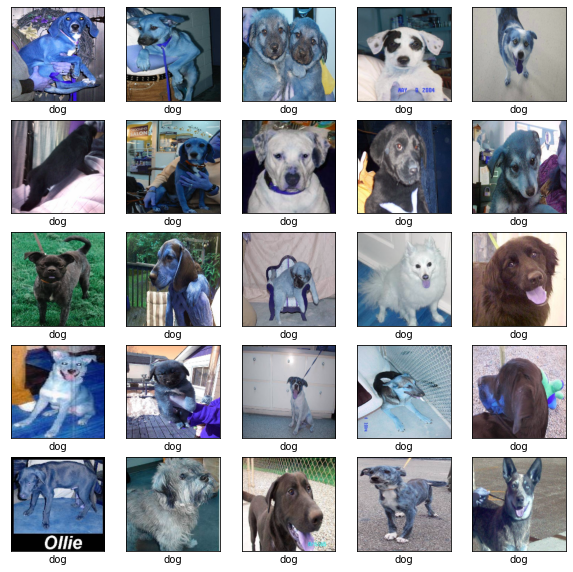

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i+4000], cmap=plt.cm.binary)
    plt.xlabel(class_names[training_data[i+4000][1]])
plt.show()

# Model Building And Summary 
- Optimizer - Adam
- loss - BinaryCrossentropy
- metric measured - Accuracy
- Activation function between layers - ReLU
- Activation function in last layers - Sigmoid
- Callback - Early stopping


## Base model
- Baseline model was selected based on Arbirary Filters.
- 3 Convolution (64,32,16) Filters respectively and 3 Max Pooling layers selected with 'valid' padding and 3 Dense layers.
- More number of filters are selected in first layer it will help us to identify key features from image.

In [ ]:
base_model = tf.keras.Sequential()
base_model.add(layers.Conv2D(64,kernel_size=(2,2),strides=(1,1),padding = 'valid',input_shape=(175,175,3),activation='relu'))
base_model.add(layers.MaxPooling2D(pool_size=(2,2)))


base_model.add(layers.Conv2D(32,kernel_size=(2,2),strides=(1,1),padding = 'valid',activation='relu'))
base_model.add(layers.MaxPooling2D(pool_size=(2,2)))


base_model.add(layers.Conv2D(16,kernel_size=(2,2),strides=(1,1),padding = 'valid',activation='relu'))
base_model.add(layers.MaxPooling2D(pool_size=(2,2)))


base_model.add(layers.Flatten())
base_model.add(layers.Dense(32,activation = 'relu'))
base_model.add(layers.Dense(16,activation = 'relu'))
base_model.add(layers.Dense(1,activation = 'sigmoid'))

In [ ]:
base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 174, 174, 64)      832       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 87, 87, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 86, 86, 32)        8224      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 43, 43, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 42, 42, 16)        2064      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 21, 21, 16)       0

In [ ]:
base_model_history = model_training_CNN(base_model)

Epoch 1/20
801/801 [==============================] - 26s 17ms/step - loss: 0.6688 - accuracy: 0.5755 - val_loss: 0.6422 - val_accuracy: 0.6594
Epoch 2/20
801/801 [==============================] - 12s 16ms/step - loss: 0.5829 - accuracy: 0.6867 - val_loss: 0.5830 - val_accuracy: 0.7103
Epoch 3/20
801/801 [==============================] - 12s 16ms/step - loss: 0.5219 - accuracy: 0.7407 - val_loss: 0.5631 - val_accuracy: 0.7064
Epoch 4/20
801/801 [==============================] - 12s 15ms/step - loss: 0.4577 - accuracy: 0.7803 - val_loss: 0.4963 - val_accuracy: 0.7568
Epoch 5/20
801/801 [==============================] - 12s 15ms/step - loss: 0.3975 - accuracy: 0.8149 - val_loss: 0.5608 - val_accuracy: 0.7514
Epoch 6/20
801/801 [==============================] - 12s 15ms/step - loss: 0.3352 - accuracy: 0.8505 - val_loss: 0.5470 - val_accuracy: 0.7430
Epoch 7/20
64/64 [==============================] - 1s 19ms/step - loss: 0.6358 - accuracy: 0.7459
[0.6358256340026855, 0.74592190980911

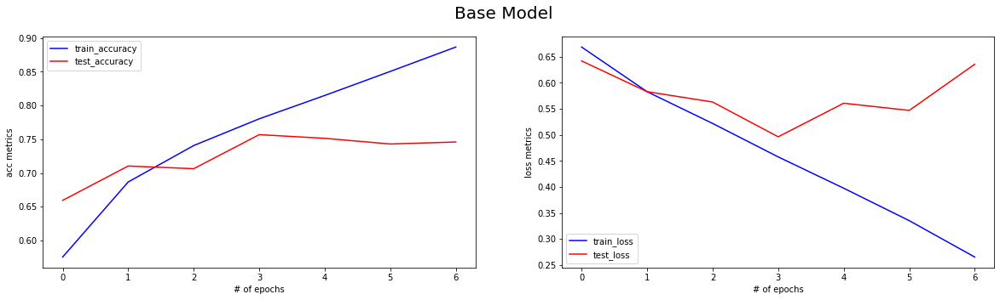

64/64 [==============================] - 1s 18ms/step - loss: 0.6358 - accuracy: 0.7459


[0.6358256340026855, 0.7459219098091125]

In [ ]:
plot(base_model,base_model_history,'Base Model')

              precision    recall  f1-score   support

           0       0.66      0.79      0.72       845
           1       0.83      0.71      0.77      1178

    accuracy                           0.75      2023
   macro avg       0.75      0.75      0.74      2023
weighted avg       0.76      0.75      0.75      2023



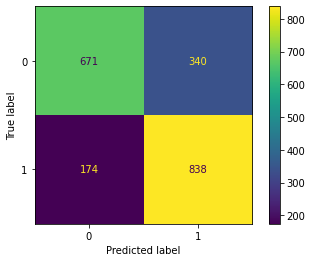

In [ ]:
report(base_model)

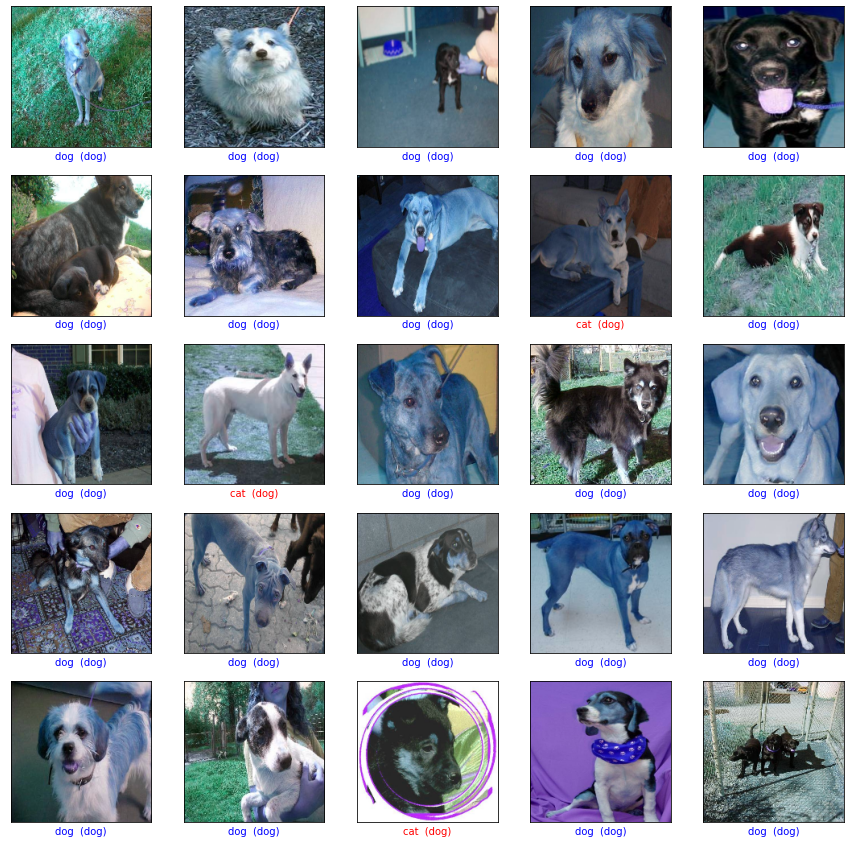

In [ ]:
predict_dog(base_model)

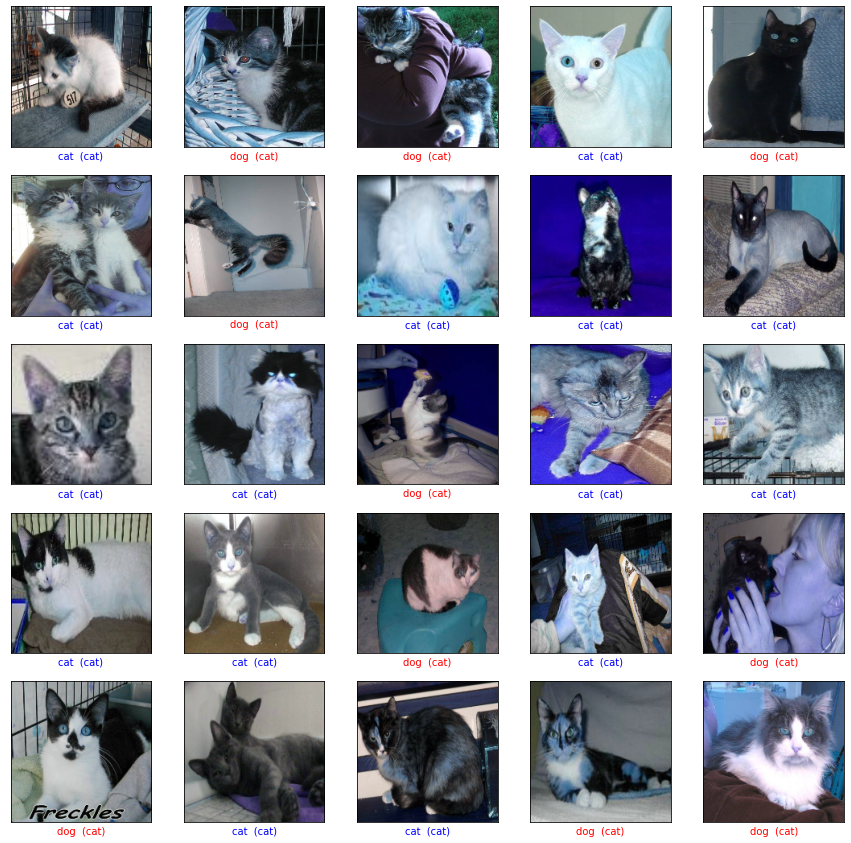

In [ ]:
predict_cat(base_model)

### Base model conclusion
- val loss reached : 0.913
- val accuracy reached : 0.71
- Learning curves shows major signs of overfitting after epoch 5.
- We were not able to predict some images of Dogs approx 6-7 out of 25 images.
- We were not able to predict some images of Cats approx 6-7 out of 25 images.

## Regularized Model
- L2 will penalize the parameters. The difference is that the weights will not be sparse and we will get much better accuracy values.
- In Regularized model we have added L2 Regularizer in Cov and Dense layers. 3 Convolution (64,32,16) Filters respectively and 3 Max Pooling layers selected with 'valid' padding and 3 Dense layers (32,16,1) each respectively.

In [ ]:
from keras import regularizers
reg_model = tf.keras.Sequential()
reg_model.add(layers.Conv2D(64,kernel_size=(2,2),strides=(1,1),padding = 'valid',input_shape=(175,175,3),kernel_regularizer=regularizers.l2(0.001),activation='relu'))
reg_model.add(layers.MaxPooling2D(pool_size=(2,2)))

reg_model.add(layers.Conv2D(32,kernel_size=(2,2),strides=(1,1),padding = 'valid',kernel_regularizer=regularizers.l2(0.001),activation='relu'))
reg_model.add(layers.MaxPooling2D(pool_size=(2,2)))

reg_model.add(layers.Conv2D(16,kernel_size=(2,2),strides=(1,1),padding = 'valid',kernel_regularizer=regularizers.l2(0.001),activation='relu'))
reg_model.add(layers.MaxPooling2D(pool_size=(2,2)))

reg_model.add(layers.Flatten())
reg_model.add(layers.Dense(32,activation = 'relu'))
reg_model.add(layers.Dense(16,activation = 'relu'))
reg_model.add(layers.Dense(1,activation = 'sigmoid'))

In [ ]:
reg_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 174, 174, 64)      832       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 87, 87, 64)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 86, 86, 32)        8224      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 43, 43, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 42, 42, 16)        2064      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 21, 21, 16)      

In [ ]:
reg_model_history = model_training_CNN(reg_model)

Epoch 1/20
801/801 [==============================] - 14s 16ms/step - loss: 0.7132 - accuracy: 0.5156 - val_loss: 0.7014 - val_accuracy: 0.5255
Epoch 2/20
801/801 [==============================] - 14s 18ms/step - loss: 0.6569 - accuracy: 0.6271 - val_loss: 0.6297 - val_accuracy: 0.6688
Epoch 3/20
801/801 [==============================] - 13s 16ms/step - loss: 0.5793 - accuracy: 0.7068 - val_loss: 0.6141 - val_accuracy: 0.6777
Epoch 4/20
801/801 [==============================] - 13s 16ms/step - loss: 0.5186 - accuracy: 0.7498 - val_loss: 0.5953 - val_accuracy: 0.6960
Epoch 5/20
801/801 [==============================] - 13s 16ms/step - loss: 0.4592 - accuracy: 0.7883 - val_loss: 0.6259 - val_accuracy: 0.6980
Epoch 6/20
801/801 [==============================] - 13s 16ms/step - loss: 0.3837 - accuracy: 0.8350 - val_loss: 0.6690 - val_accuracy: 0.7004
Epoch 7/20
801/801 [==============================] - 14s 18ms/step - loss: 0.2910 - accuracy: 0.8847 - val_loss: 0.7614 - val_accuracy:

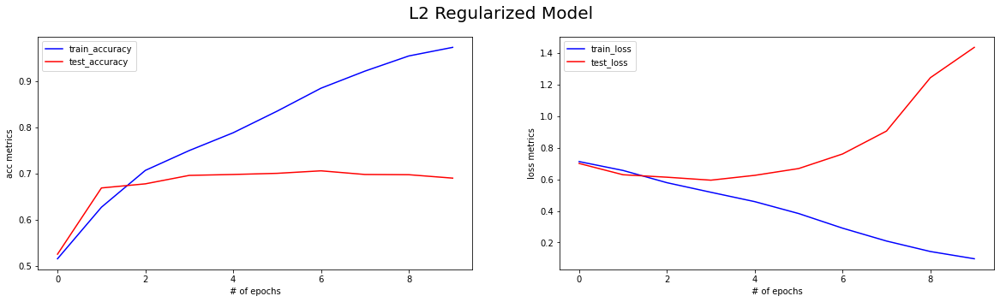

64/64 [==============================] - 1s 18ms/step - loss: 1.4373 - accuracy: 0.6901


[1.437306523323059, 0.6900642514228821]

In [ ]:
plot(reg_model,reg_model_history,'L2 Regularized Model')

              precision    recall  f1-score   support

           0       0.66      0.70      0.68       958
           1       0.72      0.68      0.70      1065

    accuracy                           0.69      2023
   macro avg       0.69      0.69      0.69      2023
weighted avg       0.69      0.69      0.69      2023



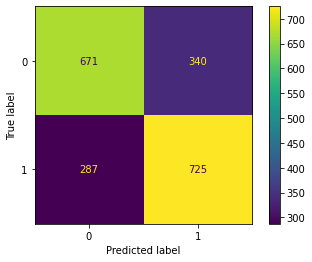

In [ ]:
report(reg_model)

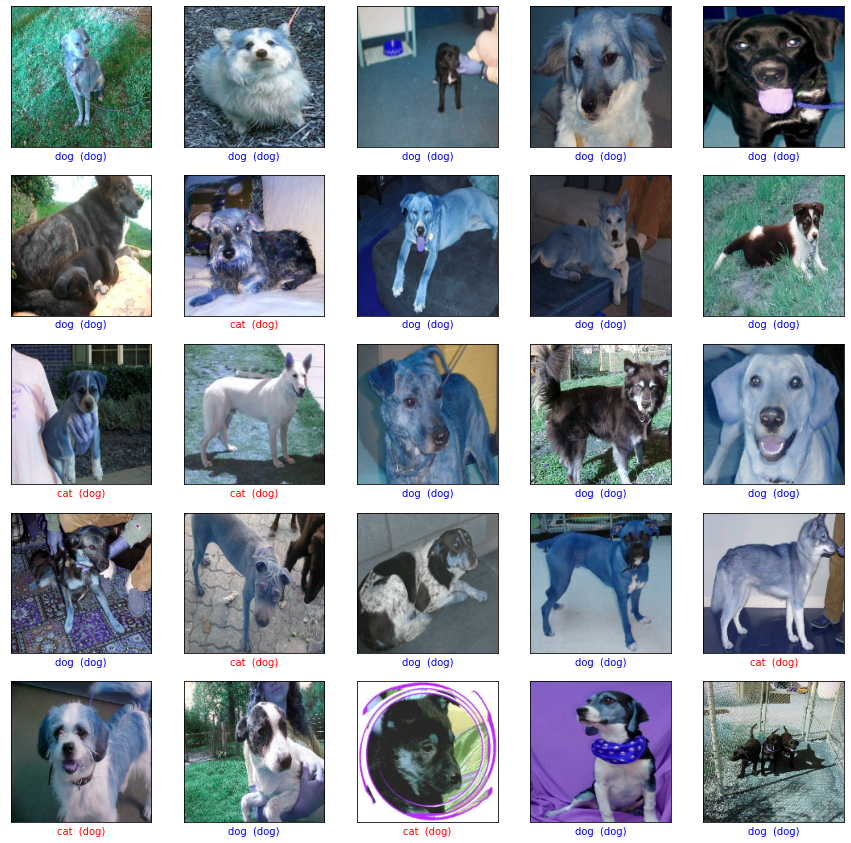

In [ ]:
predict_dog(reg_model)

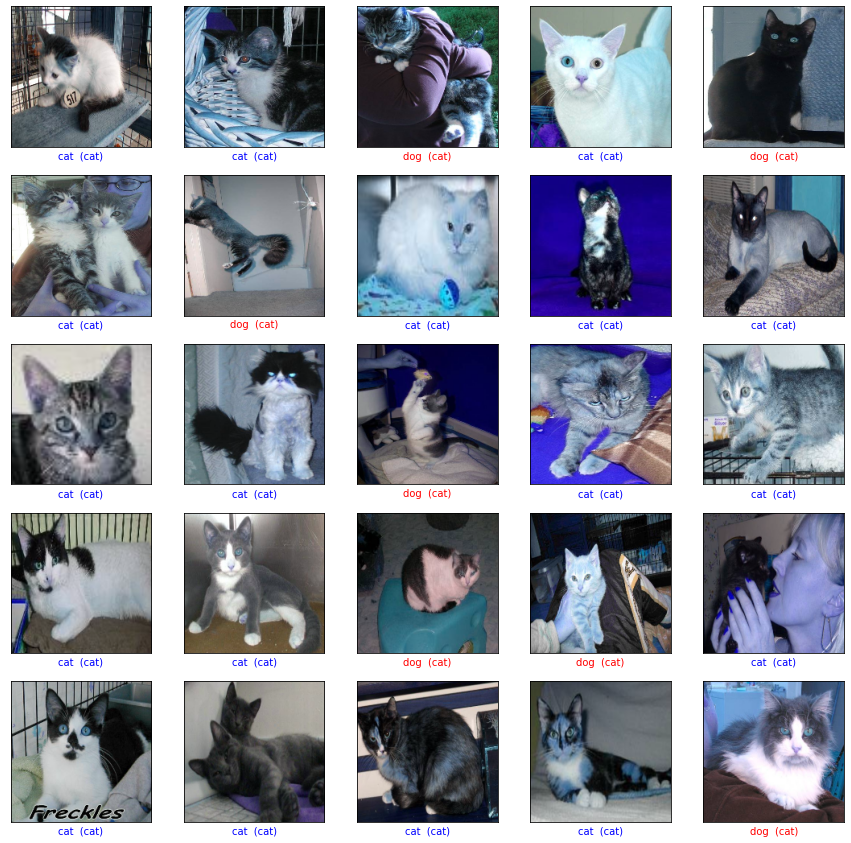

In [ ]:
predict_cat(reg_model)

### Regularized model conclusion
- val loss reached : 0.632
- val accuracy reached : 0.73
- This model performed better then baseline model.
- Learning curves shows major signs of overfitting after epoch 5.
- We were not able to predict some images of Dogs approx 6-7 out of 25 images.
- We were not able to predict some images of Cats approx 6-7 out of 25 images.


## Dropout Model
- Dropout layers are important in training CNNs because they prevent overfitting on the training data
- In Dropout model we have added Dropout layers in dense layers. 3 Convolution (64,32,16) Filters respectively and 3 Max Pooling layers selected with 'valid' padding and 3 Dense layers (32,16,1) each respectively.

In [ ]:
drop_model = tf.keras.Sequential()
drop_model.add(layers.Conv2D(64,kernel_size=(2,2),strides=(1,1),padding = 'valid',input_shape=(175,175,3),activation = 'relu'))
drop_model.add(layers.MaxPooling2D(pool_size=(2,2)))

drop_model.add(layers.Conv2D(32,kernel_size=(2,2),strides=(1,1),padding = 'valid',activation = 'relu'))
drop_model.add(layers.MaxPooling2D(pool_size=(2,2)))

drop_model.add(layers.Conv2D(16,kernel_size=(2,2),strides=(1,1),padding = 'valid',activation = 'relu'))
drop_model.add(layers.MaxPooling2D(pool_size=(2,2)))

drop_model.add(layers.Flatten())
drop_model.add(layers.Dense(32,activation = 'relu'))
drop_model.add(layers.Dropout(0.2))
drop_model.add(layers.Dense(16,activation = 'relu'))
drop_model.add(layers.Dropout(0.2))
drop_model.add(layers.Dense(1,activation = 'sigmoid'))

In [ ]:
drop_model_history = model_training_CNN(drop_model)

Epoch 1/20
801/801 [==============================] - 14s 16ms/step - loss: 0.6922 - accuracy: 0.5265 - val_loss: 0.6941 - val_accuracy: 0.5091
Epoch 2/20
801/801 [==============================] - 13s 16ms/step - loss: 0.6559 - accuracy: 0.5968 - val_loss: 0.6117 - val_accuracy: 0.6495
Epoch 3/20
801/801 [==============================] - 13s 16ms/step - loss: 0.6064 - accuracy: 0.6665 - val_loss: 0.5695 - val_accuracy: 0.6935
Epoch 4/20
801/801 [==============================] - 13s 16ms/step - loss: 0.5648 - accuracy: 0.7049 - val_loss: 0.5535 - val_accuracy: 0.7098
Epoch 5/20
801/801 [==============================] - 13s 16ms/step - loss: 0.5133 - accuracy: 0.7470 - val_loss: 0.5235 - val_accuracy: 0.7331
Epoch 6/20
801/801 [==============================] - 13s 16ms/step - loss: 0.4567 - accuracy: 0.7793 - val_loss: 0.5274 - val_accuracy: 0.7360
Epoch 7/20
801/801 [==============================] - 13s 16ms/step - loss: 0.4056 - accuracy: 0.8139 - val_loss: 0.5213 - val_accuracy:

In [ ]:
drop_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 174, 174, 64)      832       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 87, 87, 64)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 86, 86, 32)        8224      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 43, 43, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 42, 42, 16)        2064      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 21, 21, 16)      

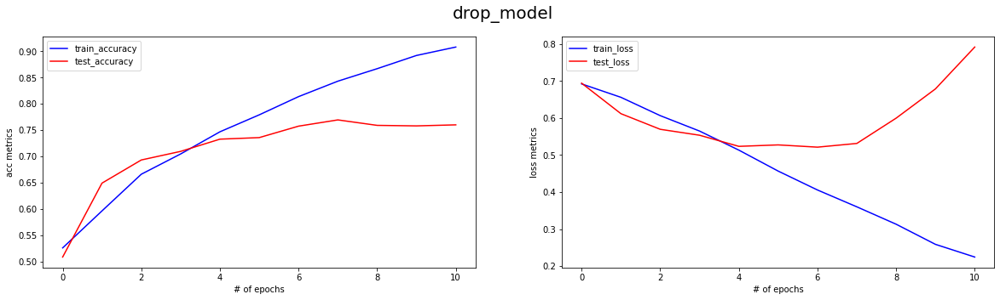

64/64 [==============================] - 1s 18ms/step - loss: 0.7917 - accuracy: 0.7603


[0.7917088270187378, 0.7602570652961731]

In [ ]:
plot(drop_model,drop_model_history,'drop_model')

              precision    recall  f1-score   support

           0       0.79      0.74      0.77      1080
           1       0.73      0.78      0.75       943

    accuracy                           0.76      2023
   macro avg       0.76      0.76      0.76      2023
weighted avg       0.76      0.76      0.76      2023



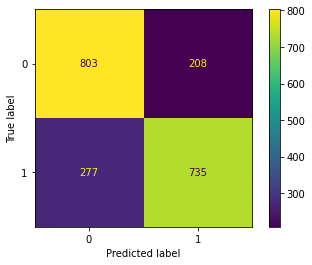

In [ ]:
report(drop_model)

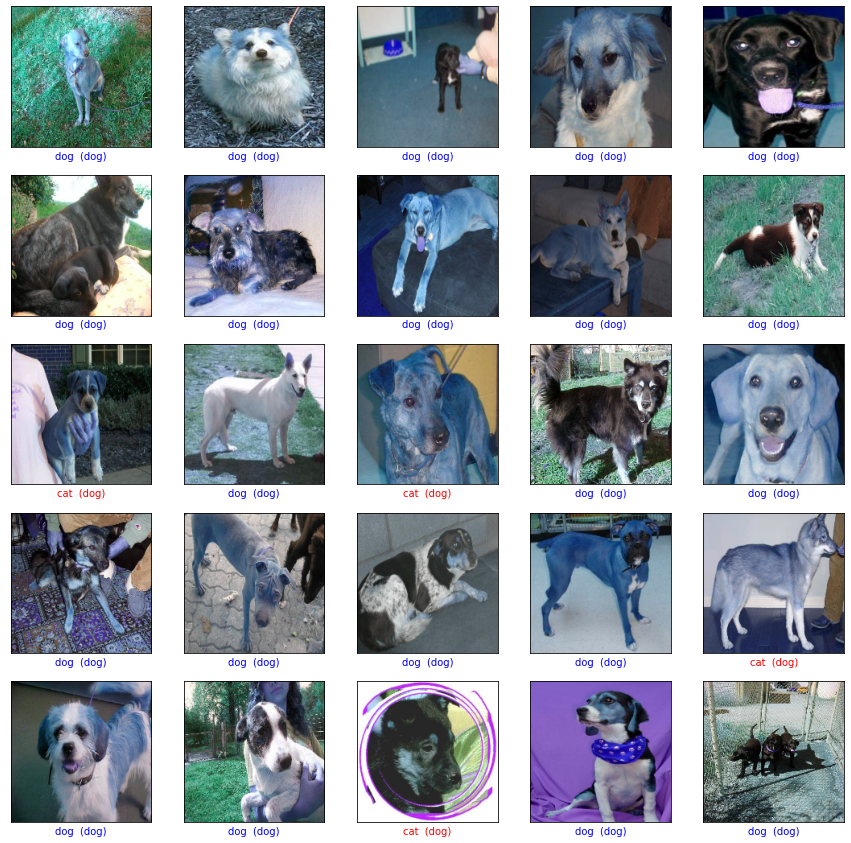

In [ ]:
predict_dog(drop_model)

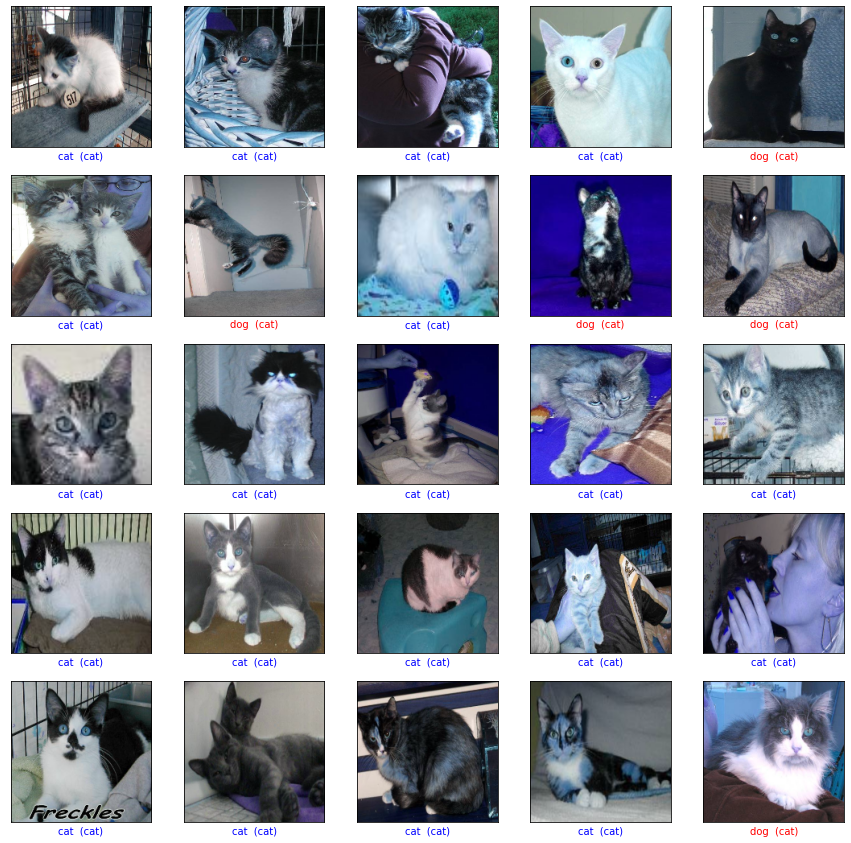

In [ ]:
predict_cat(drop_model)

### Dropout model conclusion
- val loss reached : 1.13
- val accuracy reached : 0.70
- Learning curves shows major signs of overfitting after epoch 5.
- We were not able to predict some images of Dogs approx 10-12 out of 25 images.
- We were not able to predict some images of Cats approx 4-5 out of 25 images.

## Batch Normalization Model
- Batch normalization is also used to maintain the distribution of the data. Batch normalization is one of the important features we add to our model helps as a Regularizer, normalizing the inputs, in the backpropagation process, and can be adapted to most of the models to converge better.
- In Batch Norm model we have added Batch Norm layers in Conv2D layers. 3 Convolution (64,32,16) Filters respectively and 3 Max Pooling layers selected with 'valid' padding and 3 Dense layers (32,16,1) each respectively.

In [ ]:
from keras.layers import BatchNormalization
bn_model = tf.keras.Sequential()
bn_model.add(layers.Conv2D(64,kernel_size=(2,2),strides=(1,1),padding = 'valid',input_shape=(175,175,3),activation = 'relu'))
bn_model.add(layers.BatchNormalization())
bn_model.add(layers.MaxPooling2D(pool_size=(2,2)))

bn_model.add(layers.Conv2D(32,kernel_size=(2,2),strides=(1,1),padding = 'valid',activation = 'relu'))
bn_model.add(layers.BatchNormalization())
bn_model.add(layers.MaxPooling2D(pool_size=(2,2)))

bn_model.add(layers.Conv2D(16,kernel_size=(2,2),strides=(1,1),padding = 'valid',activation = 'relu'))
bn_model.add(layers.BatchNormalization())
bn_model.add(layers.MaxPooling2D(pool_size=(2,2)))


bn_model.add(layers.Flatten())
bn_model.add(layers.Dense(32,activation = 'relu'))
bn_model.add(layers.Dense(16,activation = 'relu'))
bn_model.add(layers.Dense(1,activation = 'sigmoid'))

In [ ]:
Batch_norm_model_history = model_training_CNN(bn_model)

Epoch 1/20
801/801 [==============================] - 17s 20ms/step - loss: 0.7010 - accuracy: 0.6010 - val_loss: 0.8666 - val_accuracy: 0.5309
Epoch 2/20
801/801 [==============================] - 16s 20ms/step - loss: 0.5824 - accuracy: 0.6824 - val_loss: 0.6978 - val_accuracy: 0.6644
Epoch 3/20
801/801 [==============================] - 16s 19ms/step - loss: 0.5293 - accuracy: 0.7332 - val_loss: 0.6425 - val_accuracy: 0.6629
Epoch 4/20
801/801 [==============================] - 16s 19ms/step - loss: 0.4760 - accuracy: 0.7650 - val_loss: 0.5833 - val_accuracy: 0.7217
Epoch 5/20
801/801 [==============================] - 16s 20ms/step - loss: 0.4096 - accuracy: 0.8077 - val_loss: 0.5696 - val_accuracy: 0.7439
Epoch 6/20
801/801 [==============================] - 16s 20ms/step - loss: 0.3469 - accuracy: 0.8380 - val_loss: 0.6308 - val_accuracy: 0.7420
Epoch 7/20
801/801 [==============================] - 16s 19ms/step - loss: 0.2787 - accuracy: 0.8761 - val_loss: 0.6587 - val_accuracy:

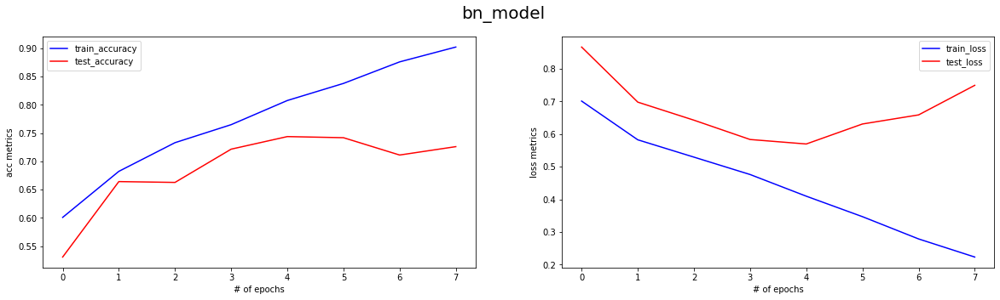

64/64 [==============================] - 1s 17ms/step - loss: 0.7493 - accuracy: 0.7261


[0.749277651309967, 0.7261492609977722]

In [ ]:
plot(bn_model,Batch_norm_model_history,'bn_model')

              precision    recall  f1-score   support

           0       0.65      0.77      0.70       853
           1       0.80      0.70      0.75      1170

    accuracy                           0.73      2023
   macro avg       0.73      0.73      0.72      2023
weighted avg       0.74      0.73      0.73      2023



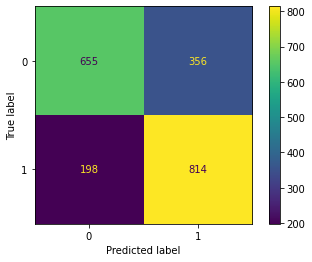

In [ ]:
report(bn_model)

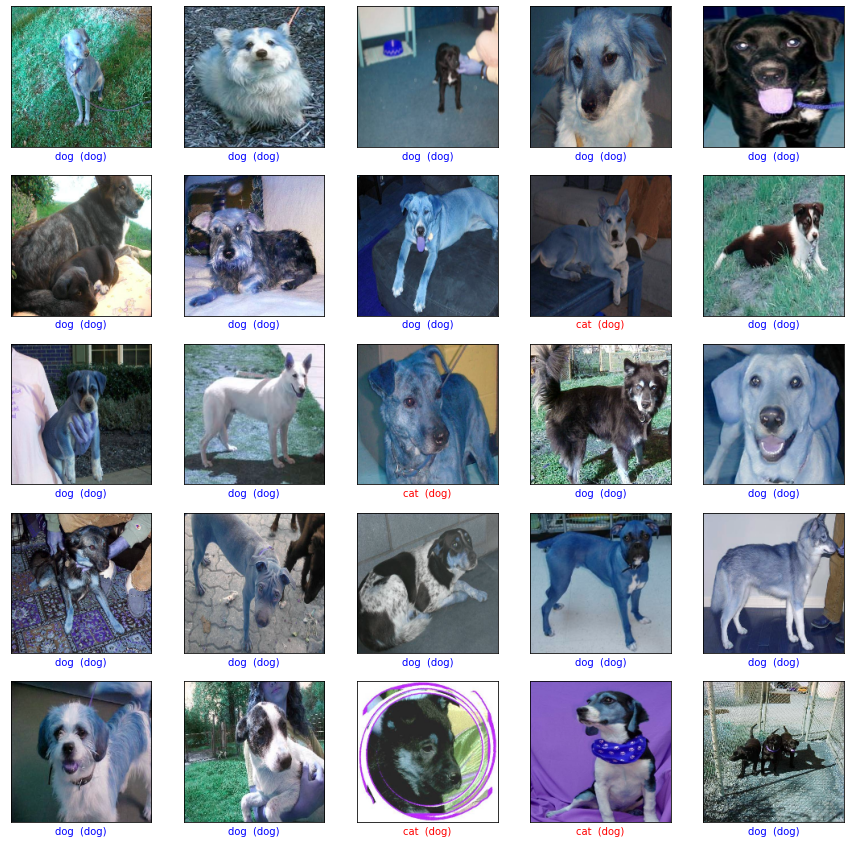

In [ ]:
predict_dog(bn_model)

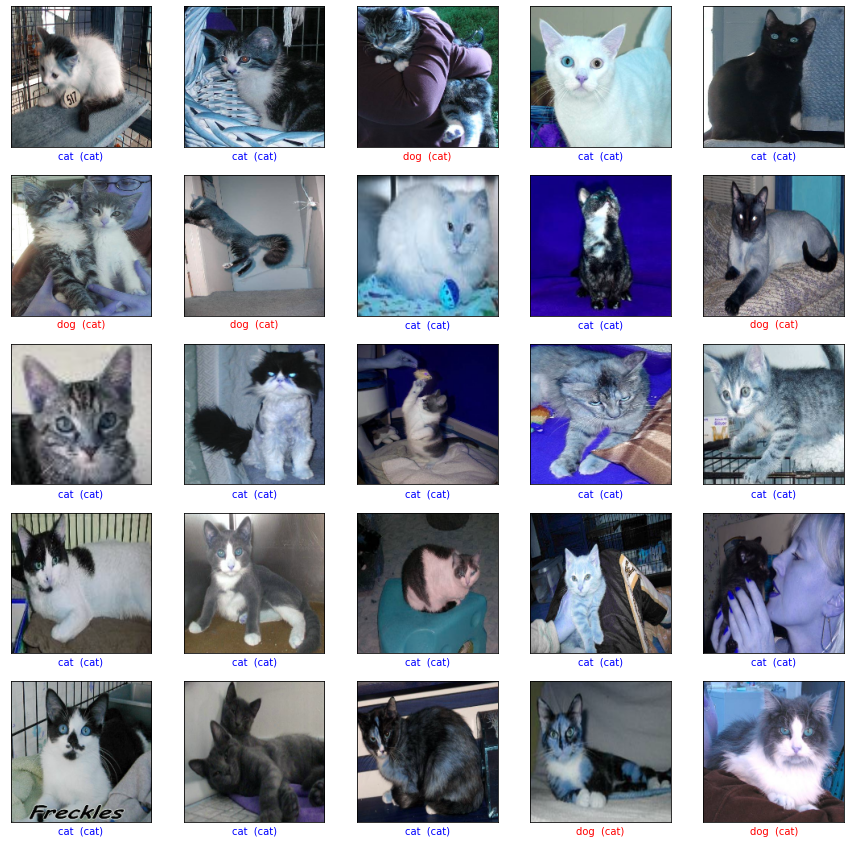

In [ ]:
predict_cat(bn_model)

#### Batch norm model conclusion
- val loss reached : 1.26
- val accuracy reached : 0.75
- Learning curves shows major signs of overfitting after epoch 3.
- We were not able to predict some images of Dogs approx 1-2 out of 25 images.
- We were not able to predict some images of Cats approx 5-6 out of 25 images.

## Combine Model
- In Combine model we have added Dropout layers in dense layers , L2 Regularization in all layers and used filters of base model. 3 Convolution (64,32,16) Filters respectively and 3 Max Pooling layers selected with 'valid' padding and 3 Dense layers (32,16,1) each respectively.

In [ ]:
combine_model = tf.keras.Sequential()
combine_model.add(layers.Conv2D(64,kernel_size=(2,2),strides=(1,1),padding = 'valid',input_shape=(175,175,3),kernel_regularizer=regularizers.l2(0.001),activation = 'relu'))
combine_model.add(layers.BatchNormalization())
combine_model.add(layers.MaxPooling2D(pool_size=(2,2)))


combine_model.add(layers.Conv2D(32,kernel_size=(2,2),strides=(1,1),padding = 'valid',kernel_regularizer=regularizers.l2(0.001),activation = 'relu'))
combine_model.add(layers.BatchNormalization())
combine_model.add(layers.MaxPooling2D(pool_size=(2,2)))

combine_model.add(layers.Conv2D(16,kernel_size=(2,2),strides=(1,1),padding = 'valid',kernel_regularizer=regularizers.l2(0.001),activation = 'relu'))
combine_model.add(layers.BatchNormalization())
combine_model.add(layers.MaxPooling2D(pool_size=(2,2)))


combine_model.add(layers.Flatten())
combine_model.add(layers.Dense(32,activation = 'relu',kernel_regularizer=regularizers.l2(0.001)))
combine_model.add(layers.Dropout(0.2))
combine_model.add(layers.Dense(16,activation = 'relu',kernel_regularizer=regularizers.l2(0.001)))
combine_model.add(layers.Dropout(0.2))
combine_model.add(layers.Dense(1,activation = 'sigmoid'))

In [ ]:
combine_model_history = model_training_CNN(combine_model)

Epoch 1/20
801/801 [==============================] - 17s 20ms/step - loss: 0.8434 - accuracy: 0.5979 - val_loss: 0.7643 - val_accuracy: 0.6757
Epoch 2/20
801/801 [==============================] - 16s 20ms/step - loss: 0.7514 - accuracy: 0.6798 - val_loss: 0.7534 - val_accuracy: 0.6678
Epoch 3/20
801/801 [==============================] - 16s 20ms/step - loss: 0.6845 - accuracy: 0.7234 - val_loss: 0.7039 - val_accuracy: 0.7197
Epoch 4/20
801/801 [==============================] - 16s 20ms/step - loss: 0.6363 - accuracy: 0.7600 - val_loss: 0.6628 - val_accuracy: 0.7484
Epoch 5/20
801/801 [==============================] - 16s 20ms/step - loss: 0.6166 - accuracy: 0.7845 - val_loss: 0.6669 - val_accuracy: 0.7509
Epoch 6/20
801/801 [==============================] - 16s 20ms/step - loss: 0.5899 - accuracy: 0.8104 - val_loss: 0.7055 - val_accuracy: 0.7410
Epoch 7/20
801/801 [==============================] - 16s 20ms/step - loss: 0.5697 - accuracy: 0.8279 - val_loss: 0.7130 - val_accuracy:

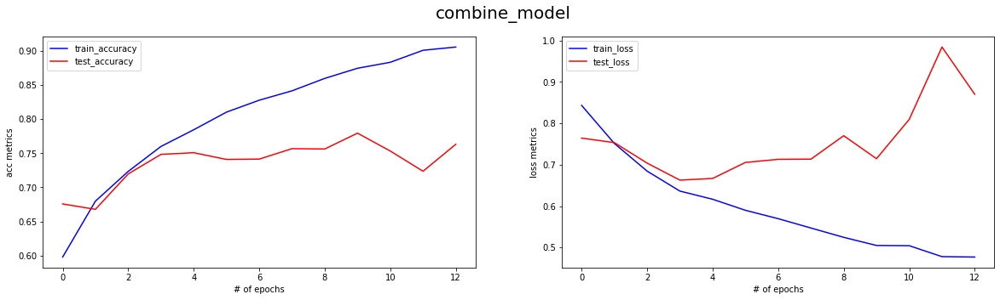

64/64 [==============================] - 1s 17ms/step - loss: 0.8702 - accuracy: 0.7632


[0.870175302028656, 0.7632229328155518]

In [ ]:
plot(combine_model,combine_model_history,'combine_model')

              precision    recall  f1-score   support

           0       0.82      0.74      0.78      1130
           1       0.70      0.80      0.75       893

    accuracy                           0.76      2023
   macro avg       0.76      0.77      0.76      2023
weighted avg       0.77      0.76      0.76      2023



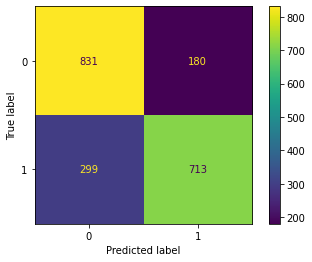

In [ ]:
report(combine_model)

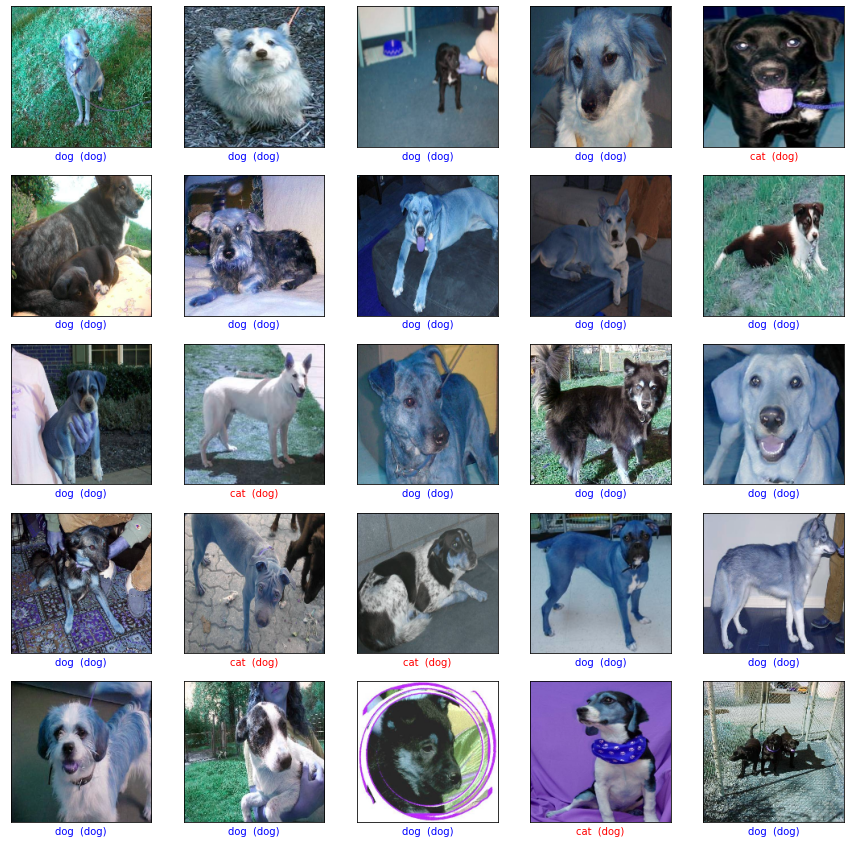

In [ ]:
predict_dog(combine_model)

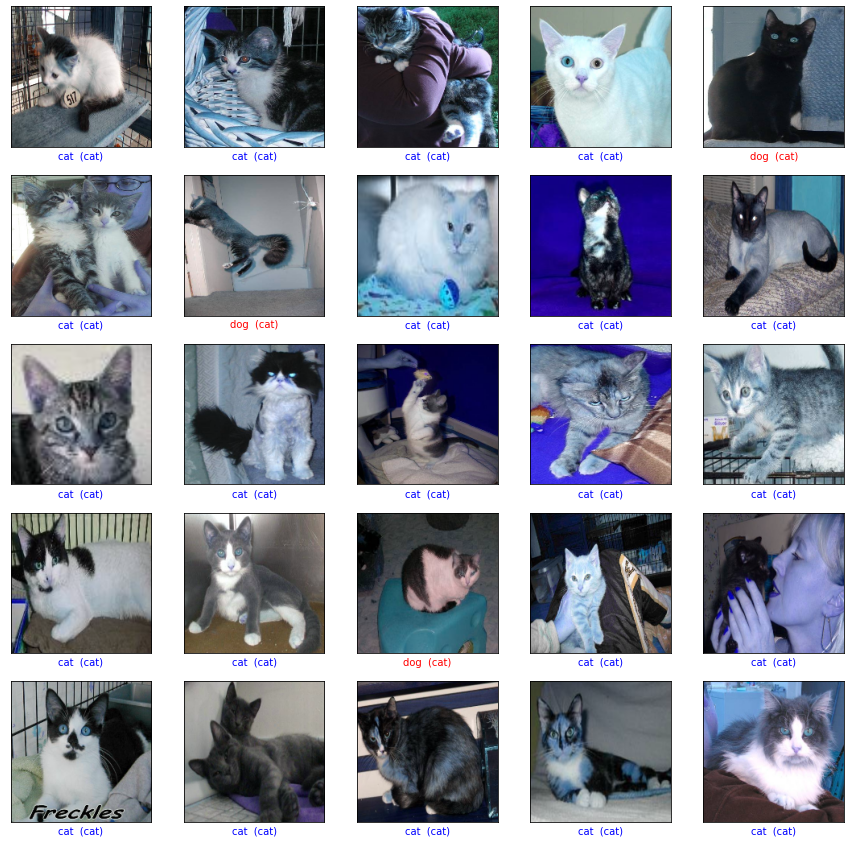

In [ ]:
predict_cat(combine_model)

### Combine model conclusion
- val loss reached : 0.751
- val accuracy reached : 0.77
- This model performed better then most of the above models.
- Learning curves shows major signs of overfitting after epoch 5.
- We were not able to predict some images of Dogs approx 5-6 out of 25 images.
- We were not able to predict some images of Cats approx 4-5 out of 25 images.

## Summary
- Best model out of all was combine model with accuracy of about 77%. Which shows that increasing number of filters in CNN in first few layers,Adding batch normalization layer does affect the outcome of model.
- Out of 25 images most images we were able to predict correctly was apporx 18-19.
- In future versions of this classification we can try to include the followings: 
-- Models - Keras Tuner model with hyperparameter tuning. 
-- Dataset - We can train on larger dataset or we can implement Data Augmentation to replicate images on different angles. 
-- CV - We can use models developed using k-fold CV.
-- Change Complexity
-- Transfer Learning - We can use ResNET 50 for transfer learning of this classification.

In [ ]:
pd.DataFrame({'Base Model': {'Val_loss': base_model.evaluate(test_images,test_labels,verbose = 0)[0], 'val_accuracy': base_model.evaluate(test_images,test_labels,verbose = 0)[1]},
              
              'Dropout Model': {'Val_loss': drop_model.evaluate(test_images,test_labels,verbose = 0)[0], 'val_accuracy': drop_model.evaluate(test_images,test_labels,verbose = 0)[1]},

              'Batch Normalization Model': {'Val_loss': bn_model.evaluate(test_images,test_labels,verbose = 0)[0], 'val_accuracy': bn_model.evaluate(test_images,test_labels,verbose = 0)[1]},

              'L2 Regularized Model': {'Val_loss': reg_model.evaluate(test_images,test_labels,verbose = 0)[0], 'val_accuracy': reg_model.evaluate(test_images,test_labels,verbose = 0)[1]},
              
              'Combine Model': {'Val_loss': combine_model.evaluate(test_images,test_labels,verbose = 0)[0], 'val_accuracy': combine_model.evaluate(test_images,test_labels,verbose = 0)[1]}})


,Base Model,Dropout Model,Batch Normalization Model,L2 Regularized Model,Combine Model
Val_loss,0.635826,0.791709,0.749278,1.437307,0.870175
val_accuracy,0.745922,0.760257,0.726149,0.690064,0.763223
